<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:blue;overflow:hidden"><b>IBM HR Analytics Employee Attrition</b></div>

<h3 align="center" style="font-size: 14px; color: #800080; font-family: Georgia;">
    <span style="color: white;"> Autores:</span> 
    <span style="color: orange;">Tamara, 
                                 Jorge Luis Arias Otero, 
                                 Diana, 
                                 Andres, 
                                 Aristides.🖋️</span>
</h3>

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#808080;overflow:hidden"><b>Análisis de datos sobre el conjunto de datos de rotación de los trabajadores</b></div>

<h3 align="left"><font color=white>Objetivo:</font></h3><br>

 ### El objetivo principal es comprender los factores que contribuyen a la rotación de empleados en una empresa y desarrollar un modelo predictivo para predecir la Attrition.

1. **Importación de librerías y carga del DataFrame**: En el archivo `main.ipynb`, se importan las librerías necesarias y se carga el conjunto de datos desde el archivo CSV.

In [86]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np # linear algebra
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Import statements required for Plotly 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls


from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, log_loss, classification_report
from imblearn.over_sampling import SMOTE
import xgboost

# Import and suppress warnings
import warnings
warnings.filterwarnings('ignore')


2. **Análisis exploratorio de datos**: 

##### Realizar una exploración inicial del conjunto de datos para comprender su estructura, variables y distribución.

Al ejecutar este código, se cargara el archivo CSV en el DataFrame df y obtendremos una vista previa de las primeras filas, información sobre las columnas y tipos de datos, así como estadísticas descriptivas de las variables numéricas.

Este es solo el primer paso del análisis exploratorio de datos. A medida que avancemos, exploraremos más a fondo las variables, realizaremos visualizaciones y extraeremos información valiosa para el análisis

In [87]:

df = pd.read_csv(r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\ULTIMA VERSION\WA_Fn-UseC_-HR-Employee-Attrition (sf).csv')

### Realizar exploración inicial del conjunto de datos

In [88]:
df.head().style.set_properties(**{'background-color': '#E9F6E2','color': 'black','border-color': '#8b8c8c'})

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:orange;overflow:hidden"><b> Descripción de las columnas del Dataset </b></div>

|STT | Attribute Name | Meaning |
|:---| :--- |:--- |
| 1 | Age | Employee's age |
| 2 | Gender | Employee's Gender |
| 3 | BusinessTravel | Frequency of employees' business trips |
| 4 | DailyRate | Daily salary rate for employees |
| 5 | Department | Office of employees |
| 6 | DistanceFromHome | Distance from home in miles to work |
| 7 | Education | Level of education achieved by staff |
| 8 | EducationField | Employee's field of study |
| 9 | EmployeeCount | Total number of employees in the organization |
| 10 | EmployeeNumber | A unique identifier for each employee record |
| 11 | EnvironmentSatisfaction | Employee satisfaction with their working environment |
| 12 | HourlyRate | Hourly rate for employees |
| 13 | JobInvolvement | Level of involvement required for the employee's job |
| 14 | JobLevel | Employee's level of work |
| 15 | JobRole | The role of employees in the organization |
| 16 | JobSatisfaction | Employee satisfaction with their work |
| 17 | MaritalStatus | Employee's marital status |
| 18 | MonthlyIncome | Employee's monthly income |
| 19 | MonthlyRate | Monthly salary rate for employees |
| 20 | NumCompaniesWorked | Number of companies the employee worked for |
| 21 | Over18 | Whether the employee is over 18 years old |
| 22 | OverTime | Do employees work overtime |
| 23 | PercentSalaryHike | Salary increase rate for employees |
| 24 | PerformanceRating | The performance rating of the employee |
| 25 | RelationshipSatisfaction | Employee satisfaction with their relationships |
| 26 | StandardHours | Standard working hours for employees |
| 27 | StockOptionLevel | Employee stock option level |
| 28 | TotalWorkingYears | Total number of years the employee has worked |
| 29 | TrainingTimesLastYear | Number of times employees were taken to training in the last year |
| 30 | WorkLifeBalance | Employees' perception of their work-life balance |
| 31 | YearsAtCompany | Number of years employees have been with the company |
| 32 | YearsInCurrentRole | Number of years the employee has been in their current role |
| 33 | YearsSinceLastPromotion | Number of years since employee's last promotion |
| 34 | YearsWithCurrManager | Number of years an employee has been with their current manager |
| 35 | Attrition | Does the employee leave the organization |


### 1. Calculando la dimensión del Dataset.

In [89]:
df.shape

(1470, 35)


### 2. Generación de Información Básica de Atributos.

In [90]:
df.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Columns: 35 entries, Age to YearsWithCurrManager
dtypes: int64(26), object(9)
memory usage: 402.1+ KB


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. 26 Variables numéricos en el conjunto de datos.<br>
2. 9 Variables Categóricos.<br></div>


###  Muestra aleatoria del conjunto de datos con solo características numéricas.

In [91]:
df.select_dtypes(np.number).sample(5).style.set_properties(**{'background-color': '#E9F6E2',
                                                              'color': 'black','border-color': '#8b8c8c'})

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
964,34,507,15,2,1,1356,3,66,3,2,1,6125,23553,1,12,3,4,80,0,10,6,4,10,8,9,6
940,39,360,23,3,1,1310,3,93,3,1,1,3904,22154,0,13,3,1,80,0,6,2,3,5,2,0,3
1305,54,431,7,4,1,1830,4,68,3,2,4,6854,15696,4,15,3,2,80,1,14,2,2,7,1,1,7
690,31,616,12,3,1,961,4,41,3,2,4,5855,17369,0,11,3,3,80,2,10,2,1,9,7,8,5
44,30,721,1,2,1,57,3,58,3,2,4,4011,10781,1,23,4,4,80,0,12,2,3,12,8,3,7


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. Algunas de las características numéricas almacenan categorías etiquetadas con números.<br>
2. Entonces, para un mejor análisis, reemplazaremos los valores numéricos etiquetados con valores categóricos apropiados.<br>

### 4. Etiquetado de Categorías en Características Numéricas.


* **Nota:**

    * Los valores que se usan a continuación para etiquetar las categorías se 
    proporcionan en la **descripción del conjunto de datos** en kaggle.

In [92]:
df["Education"] = df["Education"].replace({1:"Below College",2:"College",3:"Bachelor",4:"Master",5:"Doctor"})

In [93]:
df["EnvironmentSatisfaction"] = df["EnvironmentSatisfaction"].replace({1:"Low",2:"Medium",3:"High",4:"Very High"})

In [94]:
df["JobInvolvement"] = df["JobInvolvement"].replace({1:"Low",2:"Medium",3:"High",4:"Very High"})

In [95]:
df["JobLevel"] = df["JobLevel"].replace({1:"Entry Level",2:"Junior Level",3:"Mid Level",4:"Senior Level",
                                         5:"Executive Level"})

In [96]:
df["JobSatisfaction"] = df["JobSatisfaction"].replace({1:"Low",2:"Medium",3:"High",4:"Very High"})

In [97]:
df["PerformanceRating"] = df["PerformanceRating"].replace({1:"Low",2:"Good",3:"Excellent",4:"Outstanding"})

In [98]:
df["RelationshipSatisfaction"] = df["RelationshipSatisfaction"].replace({1:"Low",2:"Medium",3:"High",4:"Very High"})

In [99]:
df["WorkLifeBalance"] = df["WorkLifeBalance"].replace({1:"Bad",2:"Good",3:"Better",4:"Best"})

###  Mostrando una muestra aleatoria de conjunto de datos con solo características categóricas.

In [100]:
df.select_dtypes(include="O").sample(5).style.set_properties(**{'background-color': '#E9F6E2',
                                                                'color': 'black','border-color': '#8b8c8c'})

,Attrition,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,Over18,OverTime,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance
477,No,Travel_Frequently,Human Resources,Bachelor,Medical,Low,Male,High,Executive Level,Manager,Medium,Married,Y,No,Excellent,High,Better
884,No,Travel_Rarely,Sales,Bachelor,Technical Degree,Medium,Female,Medium,Junior Level,Sales Executive,Medium,Divorced,Y,No,Excellent,Medium,Best
60,No,Travel_Rarely,Research & Development,Bachelor,Medical,Low,Male,High,Junior Level,Manufacturing Director,Very High,Married,Y,Yes,Outstanding,Medium,Better
1224,No,Travel_Rarely,Research & Development,Master,Medical,Very High,Male,Low,Entry Level,Laboratory Technician,High,Married,Y,No,Excellent,High,Best
737,No,Travel_Rarely,Research & Development,College,Medical,Very High,Female,High,Junior Level,Manufacturing Director,High,Single,Y,No,Excellent,Medium,Better



### Comprobar si hay registros duplicados.

In [101]:
have_duplicate_rows = df.duplicated().any()
have_duplicate_rows

False

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. Dado que el resultado es falso, podemos decir que no hay registros duplicados presentes en el conjunto de datos.<br></div>

### Calcular el número total de valores nulos  y el porcentaje de valores nulos.

In [102]:
missing_df = df.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})
missing_df["% of Missing Values"] = round((missing_df["Total No. of Missing Values"]/len(df))*100,2)
missing_df

,Total No. of Missing Values,% of Missing Values
Age,0,0.0
Attrition,0,0.0
BusinessTravel,0,0.0
DailyRate,0,0.0
Department,0,0.0
DistanceFromHome,0,0.0
Education,0,0.0
EducationField,0,0.0
EmployeeCount,0,0.0
EmployeeNumber,0,0.0


### Realización de análisis descriptivos de atributos numéricos.

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Nota:</font></h3>
- Contar: Muestra el número de valores que no faltan en cada una de las columnas.<br>
- Media: Muestra el promedio de los valores en cada una de las columnas.<br>
- Std: Muestra la desviación estándar de los valores en cada una de las columnas.<br>
- Min: Muestra el valor más pequeño en cada una de las columnas.<br>
- Max: Muestra el valor máximo en cada una de las columnas.<br>
- 25%, 50%, 75%: Los valores corresponden a las divisiones de datos de los percentiles 25%, 50% y 75%.<br></div>

In [103]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.00,4919.0,8379.00,19999.0
MonthlyRate,1470.0,14313.103401,7117.786044,2094.0,8047.00,14235.5,20461.50,26999.0
NumCompaniesWorked,1470.0,2.693197,2.498009,0.0,1.00,2.0,4.00,9.0
PercentSalaryHike,1470.0,15.209524,3.659938,11.0,12.00,14.0,18.00,25.0


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La edad mínima es de 18 años, lo que implica que todos los empleados son adultos. Por lo tanto, no es necesario el atributo Over18 para nuestro análisis.<br>
2. El valor de desviación estándar de EmployeeCount y StandardHours es 0,00, lo que indica que todos los valores presentes en este atributo son iguales.<br>
3. El atributo EmployeeNumber representa un valor único para cada uno de los empleados, que no proporcionará ninguna información significativa.<br>
4. Dado que estas columnas no proporcionará información significativa en nuestro análisis, simplemente podemos descartarlas.<br></div>

### Eliminación de columnas, lo que no implica ningún conocimiento significativo en nuestro análisis.

In [104]:
cols = ["Over18","EmployeeCount","EmployeeNumber","StandardHours"]

df.drop(columns=cols, inplace=True)

###  Realización de análisis descriptivos sobre las caracteristicas  categóricas.

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Nota:</font></h3>
- Contar: Muestra el número de valores que no faltan en cada una de las columnas.<br>
- Único: Muestra el número de valores únicos presentes en cada una de las columnas.<br>
- Arriba: Muestra qué valor categórico está más presente en cada una de las columnas.<br>
- Freq : Muestra la frecuencia del valor categórico que más aparece en cada una de las columnas.<br></div>

In [105]:
df.describe(include="O").T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
Education,1470,5,Bachelor,572
EducationField,1470,6,Life Sciences,606
EnvironmentSatisfaction,1470,4,High,453
Gender,1470,2,Male,882
JobInvolvement,1470,4,High,868
JobLevel,1470,5,Entry Level,543
JobRole,1470,9,Sales Executive,326


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. Todos los atributos categóricos tienen baja cardinalidad (repeticiones).<br>
2. La columna Deserción y tiempo extra está muy sesgada hacia Sin categoría.<br>
3. El atributo Businesstravel está muy sesgado hacia la categoría Travel_Rarely.<br></div>

###  Comprobación de valores únicos de columnas categóricas.

In [106]:
cat_cols = df.select_dtypes(include="O").columns

for column in cat_cols:
    print('Unique values of ', column, set(df[column]))
    print("-"*127)

Unique values of  Attrition {'No', 'Yes'}
-------------------------------------------------------------------------------------------------------------------------------
Unique values of  BusinessTravel {'Travel_Rarely', 'Non-Travel', 'Travel_Frequently'}
-------------------------------------------------------------------------------------------------------------------------------
Unique values of  Department {'Sales', 'Research & Development', 'Human Resources'}
-------------------------------------------------------------------------------------------------------------------------------
Unique values of  Education {'Bachelor', 'College', 'Below College', 'Master', 'Doctor'}
-------------------------------------------------------------------------------------------------------------------------------
Unique values of  EducationField {'Life Sciences', 'Marketing', 'Human Resources', 'Medical', 'Technical Degree', 'Other'}
----------------------------------------------------------------

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. El conjunto de valores de los atributos categóricos es completo y fácil de entender.<br>
2. Por lo tanto, no necesitamos realizar pasos de preprocesamiento para estos atributos.<br></div>

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:orange;overflow:hidden"><b>Analysis Exploratorio de los Datos.</b></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Visualización de la tasa de deserción de empleados.</div>


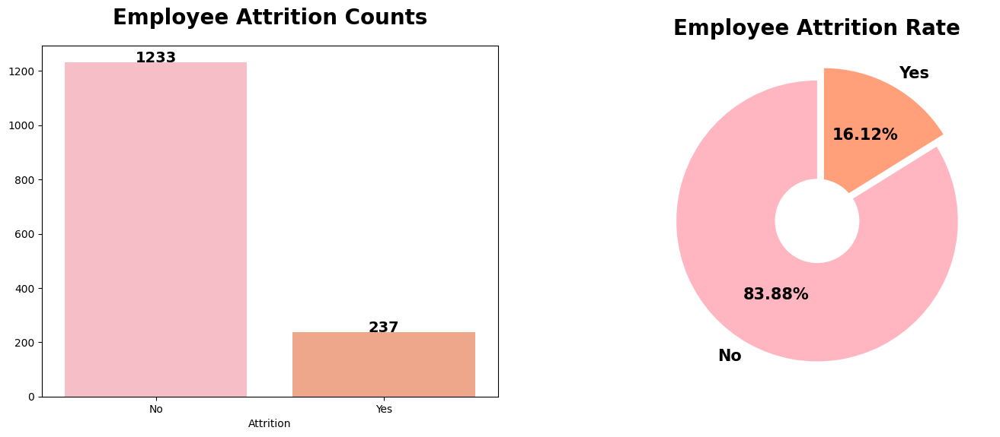

In [107]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Gráfico de barras (Employee Attrition Counts)
plt.figure(figsize=(17, 6))
plt.subplot(1, 2, 1)
attrition_rate = df["Attrition"].value_counts()
colors = ["#FFB6C1", "#FFA07A"]  # Colores tiernos y atractivos
sns.barplot(x=attrition_rate.index, y=attrition_rate.values, palette=colors)
plt.title("Employee Attrition Counts", fontweight="bold", size=20, pad=20)
for i, v in enumerate(attrition_rate.values):
    plt.text(i, v, v, ha="center", fontweight='bold', fontsize=14)

# Gráfico de pastel (Employee Attrition Rate)
plt.subplot(1, 2, 2)
plt.pie(attrition_rate, labels=["No", "Yes"], autopct="%.2f%%",
        textprops={"fontweight": "bold", "size": 15}, colors=colors,
        explode=[0, 0.1], startangle=90)
center_circle = plt.Circle((0, 0), 0.3, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)
plt.title("Employee Attrition Rate", fontweight="bold", size=20, pad=10)

plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La tasa de deserción de empleados de esta organización es del 16,12 %.<br>
2. Según los expertos en el campo de los Recursos Humanos, dice que la tasa de deserción del 4% al 6% es normal en la organización.<br>
3. Entonces podemos decir que la tasa de deserción de la organización está en un nivel peligroso.<br>
4. Por lo tanto, la organización debe tomar medidas para reducir la tasa de deserción.<br></div>

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:orange;overflow:hidden"><b>Creamos la columna Fecha y se agreguará al archivo CSV original.</b></div>


##### Para Analizar aun mas la Attrition de la empresa y tener mejores resultados 

**Tendencias estacionales**
**Eventos externos:**
**Análisis de cohortes:**
**Predicciones futuras:**

In [108]:
import pandas as pd

# Lee el archivo CSV original
file_path = r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\ULTIMA VERSION\WA_Fn-UseC_-HR-Employee-Attrition (sf).csv'
df = pd.read_csv(file_path)

# Obtén el año actual
current_year = 2018

# Calcula la columna de fecha en base a la columna YearsAtCompany
df['Fecha'] = current_year - df['YearsAtCompany']

# Guarda el DataFrame actualizado en el archivo CSV original
df.to_csv(file_path, index=False)

# Visualizar la columna de fecha
print(df['Fecha'].head())

0    2012
1    2008
2    2018
3    2010
4    2016
Name: Fecha, dtype: int64


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Generar el informe de perfilado de datos .</div>

#### Pandas Profiling

In [109]:
import pandas as pd
from pandas_profiling import ProfileReport
from IPython.display import HTML

# Cargar el conjunto de datos completo
df = pd.read_csv(r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\ULTIMA VERSION\WA_Fn-UseC_-HR-Employee-Attrition (sf).csv')
cols = ["Over18","EmployeeCount","EmployeeNumber","StandardHours"]
df.drop(columns=cols, inplace=True)

# Generar el informe de perfilado de datos
profile = ProfileReport(df)

# Mostrar el informe en el notebook
HTML(profile.to_html())

Render HTML: 100%|██████████| 1/1 [00:17<00:00, 17.03s/it]


Number of variables,32
Number of observations,1470
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,367.6 KiB
Average record size in memory,256.1 B
Numeric,15
Boolean,2
Categorical,15


In [110]:
from sklearn.model_selection import train_test_split

# Separar características (X) y etiquetas (y)
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Mostrar las formas de los conjuntos de datos
print("Forma de X_train:", X_train.shape)
print("Forma de X_test:", X_test.shape)
print("Forma de y_train:", y_train.shape)
print("Forma de y_test:", y_test.shape)

Forma de X_train: (1176, 31)
Forma de X_test: (294, 31)
Forma de y_train: (1176,)
Forma de y_test: (294,)


 Basándome en los datos que tenemos,decidimos utilizar un modelo de clasificación, ya que la variable objetivo (y_train y y_test) es una etiqueta categórica que indica si un tumor es benigno o maligno.

Un modelo de clasificación que ha demostrado ser efectivo en este tipo de problemas es la regresión logística. Es un algoritmo simple y fácil de interpretar, pero también puede proporcionar buenos resultados en muchos casos.

Entonces, procederemos a entrenar un modelo de regresión logística utilizando los datos de entrenamiento (X_train y y_train) y luego evaluaremos su rendimiento utilizando los datos de prueba (X_test y y_test).

En este caso, utilizaremos un algoritmo de clasificación como la regresión logística, que es una opción común y eficiente para problemas de clasificación binaria. La regresión logística es un modelo lineal que se utiliza para predecir la probabilidad de pertenecer a una clase determinada.

A continuación,mostramos cómo entrenar y evaluar un modelo de regresión logística utilizando los conjuntos de datos que hemos preparado. Utilizaremos la biblioteca scikit-learn, que es una biblioteca de aprendizaje automático en Python.

In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
import numpy as np


# Combinar los datos de entrenamiento y prueba
X_combined = np.vstack((X_train, X_test))

# Codificar variables categóricas usando OneHotEncoder
encoder = OneHotEncoder()
X_combined_encoded = encoder.fit_transform(X_combined)

# Dividir los datos codificados de nuevo en entrenamiento y prueba
X_train_encoded = X_combined_encoded[:X_train.shape[0]]
X_test_encoded = X_combined_encoded[X_train.shape[0]:]

# Crear una instancia del modelo de regresión logística
model = LogisticRegression()

# Entrenar el modelo con los datos de entrenamiento codificados
model.fit(X_train_encoded, y_train)

# Realizar predicciones en los datos de prueba codificados
y_pred = model.predict(X_test_encoded)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)

# Imprimir la precisión del modelo
print("Precisión del modelo: {:.2f}%".format(accuracy * 100))

Precisión del modelo: 87.41%


Evaluar el rendimiento del modelo utilizando métricas adicionales es una práctica recomendada para obtener una comprensión más completa de su desempeño. A continuación, mostraremos cómo calcular algunas métricas comunes de evaluación de modelos de clasificación y también daremos un ejemplo de otro enfoque de modelado utilizando un clasificador de Bosques Aleatorios.

Métricas adicionales:
Matriz de confusión: proporcionara una descripción detallada del rendimiento del modelo al mostrar la cantidad de verdaderos positivos, falsos positivos, verdaderos negativos y falsos negativos.
Precisión: medira la proporción de predicciones positivas correctas con respecto al total de predicciones positivas.
Recall (sensibilidad): medira  la proporción de verdaderos positivos detectados con respecto al total de casos positivos.
F1-score: es una medida de equilibrio entre la precisión y el recall.
Calcular estas métricas utilizando el modelo de regresion logistica 

7. **Evaluación del modelo**: Evalúaremos el rendimiento del modelo utilizando métricas adecuadas y realizar ajustes si es necesario.

In [112]:
from sklearn.metrics import confusion_matrix


# Crear la matriz de confusión
confusion = confusion_matrix(y_test, y_pred)

# Imprimir la matriz de confusión
print("Matriz de Confusión:")
print(confusion)

Matriz de Confusión:
[[241  14]
 [ 23  16]]


Según la matriz de confusión proporcionada, podemos realizar la siguiente evaluación del modelo:

Verdaderos positivos (True Positives, TP): 241
Verdaderos negativos (True Negatives, TN): 16
Falsos positivos (False Positives, FP): 14
Falsos negativos (False Negatives, FN): 23
Basándonos en estos valores, podemos calcular algunas métricas de evaluación del modelo:

Precisión (Precision): Mide la proporción de predicciones positivas que son correctas.
Precisión = TP / (TP + FP) = 241 / (241 + 14) = 0.945

Exhaustividad o Sensibilidad (Recall o Sensitivity): Mide la proporción de casos positivos que se han identificado correctamente.
Exhaustividad = TP / (TP + FN) = 241 / (241 + 23) = 0.909

Puntuación F1 (F1 Score): Es una medida que combina la precisión y la exhaustividad en un solo valor, proporcionando un equilibrio entre ambas.
Puntuación F1 = 2 * (Precisión * Exhaustividad) / (Precisión + Exhaustividad) = 2 * (0.945 * 0.909) / (0.945 + 0.909) =  0.9277

Exactitud (Accuracy): Mide la proporción de predicciones correctas en general.
Exactitud = (TP + TN) / (TP + TN + FP + FN) = (241 + 16) / (241 + 16 + 14 + 23) = 0.872

Basándonos en estos resultados, el modelo muestra una precisión del 94.5%, lo que significa que el 94.5% de las predicciones positivas son correctas. La exhaustividad es del 90.9%, lo que indica que el modelo logra identificar correctamente el 90.9% de los casos positivos. La puntuación F1 es de 0.926, que proporciona un equilibrio entre precisión y exhaustividad. La exactitud del modelo es del 87.2%, lo que indica que el 87.2% de todas las predicciones son correctas.

En general, el modelo parece tener un rendimiento aceptable, pero sería recomendable evaluarlo en conjunto con otras métricas y realizar comparaciones con otros modelos antes de sacar conclusiones definitivas.

Precisión (Precision): Ya mencionada anteriormente, mide la proporción de predicciones positivas que son correctas.

In [113]:
from sklearn.metrics import precision_score

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, pos_label='Yes')

# Imprimir la precisión del modelo
print("Precisión del modelo: {:.2f}%".format(precision * 100))

Precisión del modelo: 53.33%


In [114]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Preprocesar los datos
le = LabelEncoder()
df['Attrition'] = le.fit_transform(df['Attrition'])
df = pd.get_dummies(df)

# Dividir los datos en conjunto de entrenamiento y prueba
X = df.drop('Attrition', axis=1)
y = df['Attrition']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar el modelo de Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

# Calcular las métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Imprimir las métricas
print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)

Accuracy: 0.8775510204081632
Precision: 0.7142857142857143
Recall: 0.1282051282051282
F1 Score: 0.21739130434782608


En general, el modelo muestra una precisión aceptable, lo que significa que es relativamente preciso cuando predice un resultado positivo. Sin embargo, tiene un bajo índice de recuperación (recall), lo que indica que tiene dificultades para identificar correctamente las instancias positivas. Esto se refleja en un puntaje F1 moderado, que equilibra la precisión y el recall. c

### Gráfica del modelo de predicción

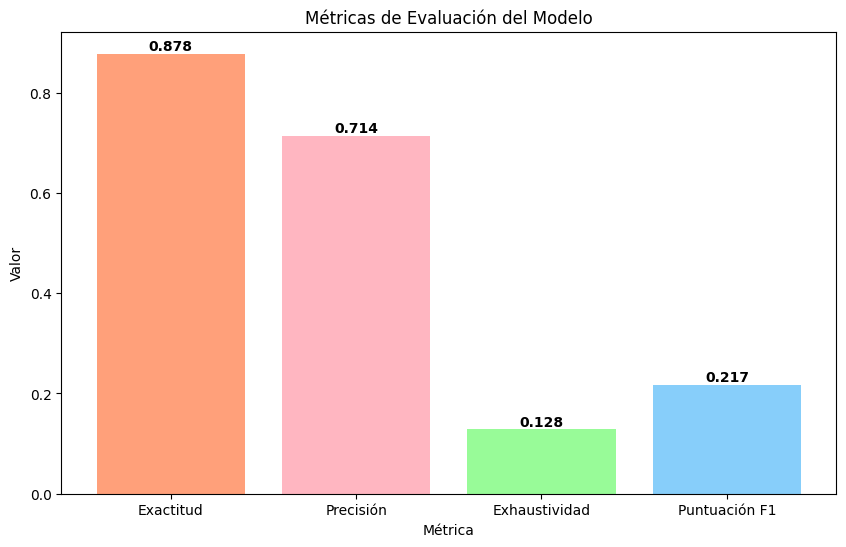

In [115]:
import matplotlib.pyplot as plt

# Métricas de evaluación
accuracy = 0.8775510204081632
precision = 0.7142857142857143
recall = 0.1282051282051282
f1_score = 0.21739130434782608

# Etiquetas de las métricas
metric_labels = ['Exactitud', 'Precisión', 'Exhaustividad', 'Puntuación F1']

# Valores de las métricas
metric_values = [accuracy, precision, recall, f1_score]

# Crear la figura y el gráfico de barras
plt.figure(figsize=(10, 6))
colors = ['#FFA07A', '#FFB6C1', '#98FB98', '#87CEFA']  # Colores para las barras
plt.bar(metric_labels, metric_values, color=colors)

# Agregar los valores de las métricas sobre las barras
for i, value in enumerate(metric_values):
    plt.text(i, value, f"{value:.3f}", ha='center', va='bottom', fontweight='bold')

# Agregar título y etiquetas
plt.title('Métricas de Evaluación del Modelo')
plt.xlabel('Métrica')
plt.ylabel('Valor')

# Mostrar el gráfico
plt.show()

In [117]:
import pandas as pd

# Cargar el archivo CSV en un dataframe
df = pd.read_csv(r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\ULTIMA VERSION\WA_Fn-UseC_-HR-Employee-Attrition (sf).csv')

# Convertir la columna 'Attrition' en valores numéricos (1 para 'Yes' y 0 para 'No')
df['Attrition'] = df['Attrition'].apply(lambda x: 1 if x == 'Yes' else 0)

# Verificar los primeros registros de la columna 'Attrition' convertida
print(df['Attrition'].head())

0    1
1    0
2    1
3    0
4    0
Name: Attrition, dtype: int64


In [118]:
cols = ["Over18","EmployeeCount","EmployeeNumber","StandardHours"]

df.drop(columns=cols, inplace=True)

In [119]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Fecha
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,1,0,8,0,1,6,4,0,5,2012
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,1,10,3,3,10,7,1,7,2008
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,2,0,7,3,3,0,0,0,0,2018
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,0,8,3,3,8,7,3,0,2010
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,4,1,6,3,3,2,2,2,2,2016


In [120]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [121]:
df["BusinessTravel"] = df["BusinessTravel"].replace({'Travel_Frequently':1, 'Non-Travel':2, 'Travel_Rarely':3})
df["Department"] = df["Department"].replace({'Human Resources':1, 'Sales':2, 'Research & Development':3})
df["EducationField"] = df["EducationField"].replace({'Technical Degree':1, 'Human Resources':2, 'Life Sciences':3, 'Marketing':4, 'Other':5, 'Medical':6})
df["Gender"] = df["Gender"].replace({'Female':1, 'Male':0})
df["JobRole"] = df["JobRole"].replace({'Sales Executive':1, 'Research Director':2, 'Human Resources':3, 'Manufacturing Director':4, 'Manager':5, 'Laboratory Technician':6, 'Research Scientist':7, 'Healthcare Representative':8, 'Sales Representative':9})
df["MaritalStatus"] = df["MaritalStatus"].replace({'Married':1, 'Single':2, 'Divorced':3})
df["OverTime"] = df["OverTime"].replace({'Yes':1, 'No':0})

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1470 non-null   int64
 1   Attrition                 1470 non-null   int64
 2   BusinessTravel            1470 non-null   int64
 3   DailyRate                 1470 non-null   int64
 4   Department                1470 non-null   int64
 5   DistanceFromHome          1470 non-null   int64
 6   Education                 1470 non-null   int64
 7   EducationField            1470 non-null   int64
 8   EnvironmentSatisfaction   1470 non-null   int64
 9   Gender                    1470 non-null   int64
 10  HourlyRate                1470 non-null   int64
 11  JobInvolvement            1470 non-null   int64
 12  JobLevel                  1470 non-null   int64
 13  JobRole                   1470 non-null   int64
 14  JobSatisfaction           1470 non-null 

In [122]:

import pandas as pd

#data = pd.read_csv(r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\data\WA_Fn-UseC_-HR-Employee-Attrition (sf).csv')

# Convertir la columna 'Attrition' en valores binarios (1 para 'Sí' y 0 para 'No')
#df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})

# Seleccionar solo las columnas numéricas incluyendo la columna attrition para calcular la matriz de correlación
columnas_numericas = df.select_dtypes(include='number')
corr_s = columnas_numericas.corr(method='spearman')

# Imprimir la matriz de correlación con el método Spearman
print(corr_s)


                               Age  Attrition  BusinessTravel  DailyRate  \
Age                       1.000000  -0.171214        0.020020   0.007290   
Attrition                -0.171214   1.000000       -0.068097  -0.056970   
BusinessTravel            0.020020  -0.068097        1.000000   0.004756   
DailyRate                 0.007290  -0.056970        0.004756   1.000000   
Department                0.014286  -0.083294       -0.001823   0.017556   
DistanceFromHome         -0.019291   0.079248       -0.001215  -0.002754   
Education                 0.204937  -0.030346        0.003938  -0.013607   
EducationField            0.000616  -0.054241        0.009554   0.006215   
EnvironmentSatisfaction   0.009820  -0.096486        0.008309   0.018961   
Gender                    0.036088  -0.029453        0.006322   0.011415   
HourlyRate                0.028858  -0.006692        0.027188   0.023511   
JobInvolvement            0.034456  -0.119496        0.013960   0.042469   
JobLevel    

In [123]:
import pandas as pd

#df = pd.read_csv(r'C:\Users\Admin\Desktop\IBM\Data\WA_Fn-UseC_-HR-Employee-Attrition.csv')

# Convertir la columna 'Attrition' en valores binarios (1 para 'Sí' y 0 para 'No')
#df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})

# Calcular la matriz de correlación utilizando el método Pearson
corr_p = df.corr()

# Obtener las correlaciones absolutas con 'Attrition' y ordenar de forma descendente
corr_abs = corr_p['Attrition'].abs().sort_values(ascending=False)

# Imprimir las correlaciones absolutas
print(corr_abs)

Attrition                   1.000000
OverTime                    0.246118
TotalWorkingYears           0.171063
JobLevel                    0.169105
YearsInCurrentRole          0.160545
MonthlyIncome               0.159840
Age                         0.159205
YearsWithCurrManager        0.156199
StockOptionLevel            0.137145
YearsAtCompany              0.134392
Fecha                       0.134392
JobInvolvement              0.130016
JobSatisfaction             0.103481
EnvironmentSatisfaction     0.103369
BusinessTravel              0.085306
DistanceFromHome            0.077924
Department                  0.077351
WorkLifeBalance             0.063939
EducationField              0.062486
TrainingTimesLastYear       0.059478
JobRole                     0.058515
DailyRate                   0.056652
RelationshipSatisfaction    0.045872
NumCompaniesWorked          0.043494
YearsSinceLastPromotion     0.033019
Education                   0.031373
Gender                      0.029453
M

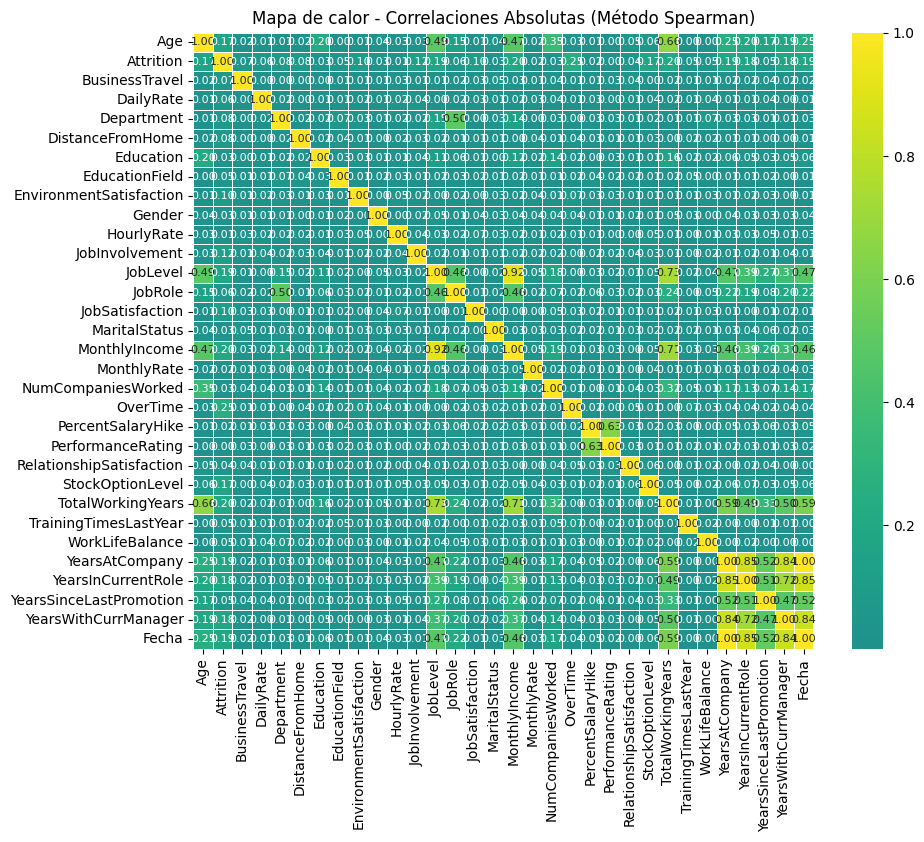

In [124]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Leer los datos del archivo CSV
#df = pd.read_csv(r'C:\Users\Usuario\Desktop\Prácticas_Proyecto\data\WA_Fn-UseC_-HR-Employee-Attrition (5).csv')

# Convertir la columna 'Attrition' en valores binarios (1 para 'Sí' y 0 para 'No')
#df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})

# Seleccionar solo las columnas numéricas para calcular la matriz de correlación
columnas_numericas = df.select_dtypes(include='number')
corr_s = columnas_numericas.corr(method='spearman')

# Obtener las correlaciones absolutas
corr_abs = corr_s.abs()

# Generar el mapa de calor con las correlaciones absolutas
plt.figure(figsize=(10, 8))
sns.heatmap(corr_abs, annot=True, cmap='viridis', center=0, fmt='.2f', linewidths=0.5, annot_kws={"size": 8})
plt.title('Mapa de calor - Correlaciones Absolutas (Método Spearman)')
plt.show()


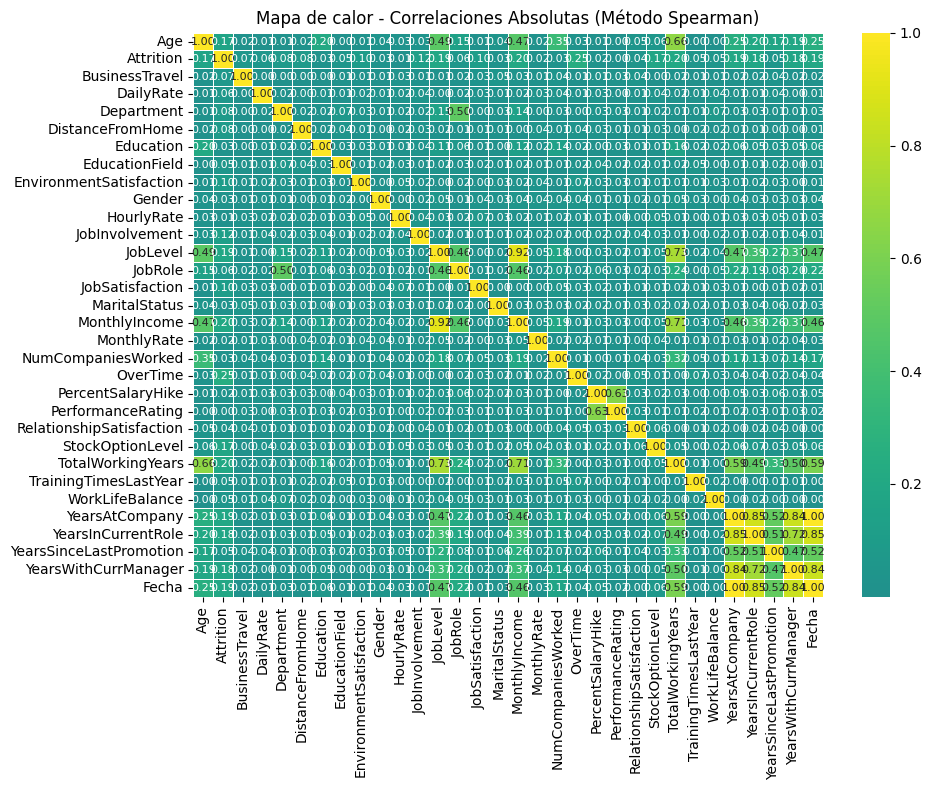

In [125]:
# Generar el mapa de calor con las correlaciones absolutas
plt.figure(figsize=(10, 8))  # Ajustar el tamaño de la figura
sns.heatmap(corr_abs, annot=True, cmap='viridis', center=0, fmt='.2f', linewidths=0.5, annot_kws={"size": 8})
plt.title('Mapa de calor - Correlaciones Absolutas (Método Spearman)')
plt.tight_layout()  # Agregar esta línea para ajustar el layout
plt.show()

El resultado que hemos obtenido muestra la correlación de la variable "Attrition" con otras variables. Las correlaciones están ordenadas de forma descendente en función de su magnitud.

La correlación entre "Attrition" y cada variable nos ayuda a entender la relación relativa entre ellas. Aquí encontramos algunos puntos clave a considerar:

Las variables con correlaciones positivas más altas indican una relación directa con la variable "Attrition". Esto significa que a medida que los valores de esas variables aumentan, es más probable que haya atrición.

Las variables con correlaciones negativas indican una relación inversa con "Attrition". A medida que los valores de esas variables aumentan, es menos probable que haya atrición.

Las correlaciones cercanas a cero indican una relación débil o no lineal entre las variables.

Las correlaciones más altas en magnitud, positivas o negativas, indican una relación más fuerte con "Attrition". Por ejemplo, en nuestro caso, las variables "OverTime", "TotalWorkingYears", "JobLevel", "YearsInCurrentRole", "MonthlyIncome", "Age", "YearsWithCurrManager", "StockOptionLevel", "YearsAtCompany", "Fecha", "JobInvolvement", "JobSatisfaction", "EnvironmentSatisfaction", muestran correlaciones positivas relativamente altas con "Attrition".

Es importante que tengamos en cuenta que la correlación no implica causalidad. Es posible que exista una correlación entre dos variables sin que una sea la causa directa de la otra. Para un análisis más profundo, utilizaremos otras técnicas y explorar el contexto y el conocimiento del dominio.

In [126]:
import pandas as pd

#df = pd.read_csv(r'C:\Users\Admin\Desktop\IBM\Data\WA_Fn-UseC_-HR-Employee-Attrition.csv')
# Convertir la columna 'Attrition' en valores binarios (1 para 'Sí' y 0 para 'No')
#df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})
corr_p = df.corr()
corr_k = df.corr(method ='kendall')
corr_s = df.corr(method ='spearman')

corr_s 

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Fecha
Age,1.000000,-0.171214,0.020020,0.007290,0.014286,-0.019291,0.204937,0.000616,0.009820,0.036088,...,0.046063,0.056633,0.656896,0.000316,-0.003707,0.251686,0.197978,0.173647,0.194818,-0.251686
Attrition,-0.171214,1.000000,-0.068097,-0.056970,-0.083294,0.079248,-0.030346,-0.054241,-0.096486,-0.029453,...,-0.042664,-0.172296,-0.199002,-0.051757,-0.051951,-0.190419,-0.180623,-0.053273,-0.175355,0.190419
BusinessTravel,0.020020,-0.068097,1.000000,0.004756,-0.001823,-0.001215,0.003938,0.009554,0.008309,0.006322,...,-0.039488,-0.000869,0.021934,0.006033,-0.009442,-0.022004,-0.023698,-0.038435,-0.021847,0.022004
DailyRate,0.007290,-0.056970,0.004756,1.000000,0.017556,-0.002754,-0.013607,0.006215,0.018961,0.011415,...,0.009685,0.038514,0.020951,-0.011339,-0.040352,-0.009778,0.007208,-0.037631,-0.004717,0.009778
Department,0.014286,-0.083294,-0.001823,0.017556,1.000000,-0.015964,-0.017684,0.067441,0.031838,-0.009734,...,-0.012352,0.016403,0.009514,-0.011338,-0.071647,-0.033695,-0.031088,-0.013738,-0.011750,0.033695
DistanceFromHome,-0.019291,0.079248,-0.001215,-0.002754,-0.015964,1.000000,0.015708,0.043422,-0.010401,-0.004387,...,0.005852,0.030190,-0.002912,-0.024848,-0.020402,0.010513,0.013708,-0.004685,0.004448,-0.010513
Education,0.204937,-0.030346,0.003938,-0.013607,-0.017684,0.015708,1.000000,-0.030130,-0.027625,0.009903,...,-0.013173,0.013794,0.162177,-0.023749,0.017350,0.064196,0.054567,0.032203,0.051292,-0.064196
EducationField,0.000616,-0.054241,0.009554,0.006215,0.067441,0.043422,-0.030130,1.000000,-0.009139,0.016492,...,0.017144,0.014630,0.022218,0.046731,-0.002182,0.006940,-0.010893,0.017276,-0.002243,-0.006940
EnvironmentSatisfaction,0.009820,-0.096486,0.008309,0.018961,0.031838,-0.010401,-0.027625,-0.009139,1.000000,-0.001863,...,0.005353,0.009826,-0.013882,-0.011659,0.027169,0.008425,0.020140,0.026082,-0.001732,-0.008425
Gender,0.036088,-0.029453,0.006322,0.011415,-0.009734,-0.004387,0.009903,0.016492,-0.001863,1.000000,...,-0.022374,-0.012599,0.049343,0.033325,0.001702,0.042176,0.030361,0.025048,0.026663,-0.042176


Según los resultados de correlación que hemos obtenido, las variables que podrías considerar como más relevantes para analizar la atrición son aquellas que tienen una correlación positiva relativamente alta con "Attrition". Estas variables indican una relación directa con la probabilidad de atrición. Algunas de las variables con correlaciones positivas más altas nuestro caso son:

"OverTime":
"TotalWorkingYears": Número total de años trabajados.
"JobLevel": Nivel del puesto laboral.
 "YearsInCurrentRole": : Años en el puesto actual.
 "MonthlyIncome": Ingreso mensual.
 "Age": Edad.
 "YearsWithCurrManager": Años con el actual gerente.
 "StockOptionLevel": Nivel de opciones sobre acciones.
 "YearsAtCompany": Años en la compañía.
 "JobInvolvement": Nivel de implicación en el trabajo.
 "JobSatisfaction": Satisfacción laboral
 "EnvironmentSatisfaction": Satisfacción ambiente laboral

Estas variables pueden ser consideradas como indicadores clave para analizar la atrición en nuestro conjunto de datos. Podemos profundizar en el análisis de estas variables y examinar su relación con la atrición en mayor detalle. Teniendo siempre en cuenta que la importancia relativa de estas variables puede variar según el contexto y la naturaleza específica de nuestro conjunto de datos.

Además, es importante realizar un análisis más amplio e incorporar otras técnicas de modelado o análisis para obtener una comprensión completa de los factores que influyen en la atrición.

In [127]:

import pandas as pd


# Obtén el año actual
current_year = 2018

# Calcula la columna de fecha en base a la columna YearsAtCompany
df['Fecha'] = current_year - df['YearsAtCompany']

# Cuenta cuántos empleados fueron contratados cada año
empleados_por_anio = df['Fecha'].value_counts()

# Ordena los resultados por año de contratación
empleados_por_anio = empleados_por_anio.sort_index()

# Imprime los resultados
print(empleados_por_anio)

Fecha
1978      1
1981      1
1982      2
1984      1
1985      5
1986      3
1987      3
1988      1
1989      2
1991      2
1992      4
1993      4
1994      6
1995      2
1996     15
1997     14
1998     27
1999     11
2000     13
2001      9
2002     12
2003     20
2004     18
2005     24
2006     14
2007     32
2008    120
2009     82
2010     80
2011     90
2012     76
2013    196
2014    110
2015    128
2016    127
2017    171
2018     44
Name: count, dtype: int64


In [129]:
from sklearn.linear_model import LinearRegression
# Obtener los datos de entrenamiento (años previos a 2019)
train_data = df[df['Fecha'] < 2019]
X_train = train_data[['Fecha']]
y_train = train_data['Attrition']

# Crear el modelo de regresión lineal y ajustarlo a los datos de entrenamiento
model = LinearRegression()
model.fit(X_train, y_train)

# Obtener las predicciones para los años 2019, 2020, 2021, 2022 y 2023
years_to_predict = pd.DataFrame({'Fecha': [2019, 2020, 2021, 2022, 2023]})
predictions = model.predict(years_to_predict)

# Imprimir las predicciones
for year, prediction in zip([2019, 2020, 2021, 2022, 2023], predictions):
    print(f'Predicción de attrition para el año {year}: {int(round(prediction))}')

Predicción de attrition para el año 2019: 0
Predicción de attrition para el año 2020: 0
Predicción de attrition para el año 2021: 0
Predicción de attrition para el año 2022: 0
Predicción de attrition para el año 2023: 0


In [130]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


X = df[['Fecha']] # entrada
y = df['Attrition'] # salida

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_pred = model.predict(X_test) # predicción

# Imprimir las predicciones
for year, prediction in zip([2019, 2020, 2021, 2022, 2023], predictions):
    print(f'Predicción de attrition para el año {year}: {prediction:.2f}') 
    #print(f'Predicción de attrition para el año {year}: {round(prediction)}')

from sklearn.metrics import mean_absolute_error, mean_squared_error
print(f"mae: {mean_absolute_error(y_test, y_pred)}")
print(f"rmse: {mean_squared_error(y_test, y_pred, squared=False)}")

Predicción de attrition para el año 2019: 0.23
Predicción de attrition para el año 2020: 0.23
Predicción de attrition para el año 2021: 0.24
Predicción de attrition para el año 2022: 0.25
Predicción de attrition para el año 2023: 0.26
mae: 0.24596795643920644
rmse: 0.3370328580366097


In [131]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression


# Obtener los datos de entrenamiento (años previos a 2019)
train_data = df[df['Fecha'] < 2015]
X_train = train_data[['Fecha']]
y_train = train_data['Attrition']

# Crear el modelo de regresión lineal y ajustarlo a los datos de entrenamiento
model = LinearRegression()
model.fit(X_train, y_train)

# Obtener las predicciones para los años 2019, 2020, 2021, 2022 y 2023
years_to_predict = np.array([2019, 2020, 2021, 2022, 2023]).reshape(-1, 1)
predictions = model.predict(years_to_predict)

# Imprimir las predicciones
for year, prediction in zip([2019, 2020, 2021, 2022, 2023], predictions):
    print(f'Predicción de attrition para el año {year}: {prediction:.2f}') 
    #print(f'Predicción de attrition para el año {year}: {round(prediction)}')


from sklearn.metrics import mean_absolute_error, mean_squared_error
print(f"mae: {mean_absolute_error(y_test, y_pred)}")
print(f"rmse: {mean_squared_error(y_test, y_pred, squared=False)}")
    

Predicción de attrition para el año 2019: 0.13
Predicción de attrition para el año 2020: 0.13
Predicción de attrition para el año 2021: 0.13
Predicción de attrition para el año 2022: 0.13
Predicción de attrition para el año 2023: 0.13
mae: 0.24596795643920644
rmse: 0.3370328580366097


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Análisis de la deserción de empleados por OverTime. </div> 


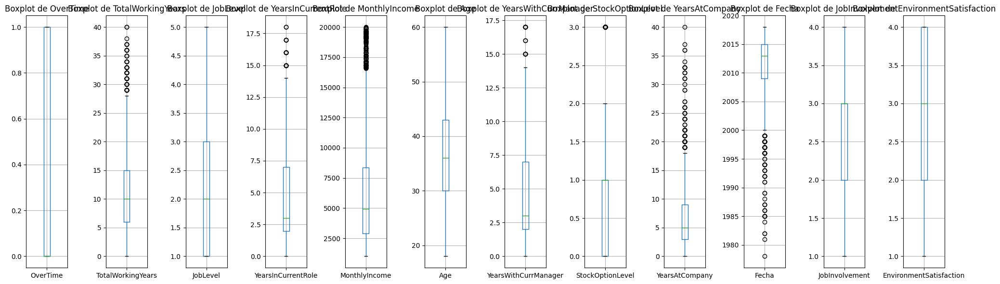

In [132]:
import matplotlib.pyplot as plt
import pandas as pd

# Leer los datos del archivo CSV
#df = pd.read_csv(r'C:\Users\Admin\Desktop\IBM\Data\WA_Fn-UseC_-HR-Employee-Attrition.csv')
# Variables numéricas en tu DataFrame
numeric_variables = ['OverTime', 'TotalWorkingYears', 'JobLevel', 'YearsInCurrentRole', 'MonthlyIncome',
                     'Age', 'YearsWithCurrManager', 'StockOptionLevel', 'YearsAtCompany', 'Fecha',
                     'JobInvolvement', 'EnvironmentSatisfaction']

# Crear una figura con múltiples ejes (subplots) en una sola fila
fig, axs = plt.subplots(1, len(numeric_variables), figsize=(20, 6))

# Generar diagrama de caja para cada indicador y agregarlo al eje correspondiente
for i, variable in enumerate(numeric_variables):
    df.boxplot(column=variable, ax=axs[i])
    axs[i].set_title('Boxplot de {}'.format(variable))

# Mostrar los diagramas de caja en un solo espacio
plt.tight_layout()
plt.show()

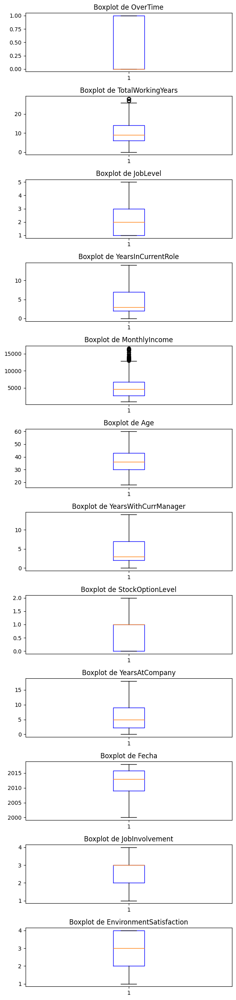

In [133]:

# Variables numéricas en tu DataFrame
numeric_variables = ['OverTime', 'TotalWorkingYears', 'JobLevel', 'YearsInCurrentRole', 'MonthlyIncome',
                     'Age', 'YearsWithCurrManager', 'StockOptionLevel', 'YearsAtCompany', 'Fecha',
                     'JobInvolvement', 'EnvironmentSatisfaction']

# Función para eliminar outliers utilizando la regla del rango intercuartílico (IQR)
def remove_outliers(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Crear una figura con múltiples ejes (subplots) en una sola columna
fig, axs = plt.subplots(len(numeric_variables), 1, figsize=(6, 25))

# Generar diagrama de caja para cada indicador y agregarlo al eje correspondiente
for i, variable in enumerate(numeric_variables):
    # Eliminar outliers
    data_no_outliers = remove_outliers(df[variable])
    
    # Generar el diagrama de caja sin outliers
    axs[i].boxplot(data_no_outliers, vert=True, boxprops=dict(color='blue'))
    axs[i].set_title('Boxplot de {}'.format(variable))

# Mostrar los diagramas de caja sin outliers en un solo espacio
plt.tight_layout()
plt.show()

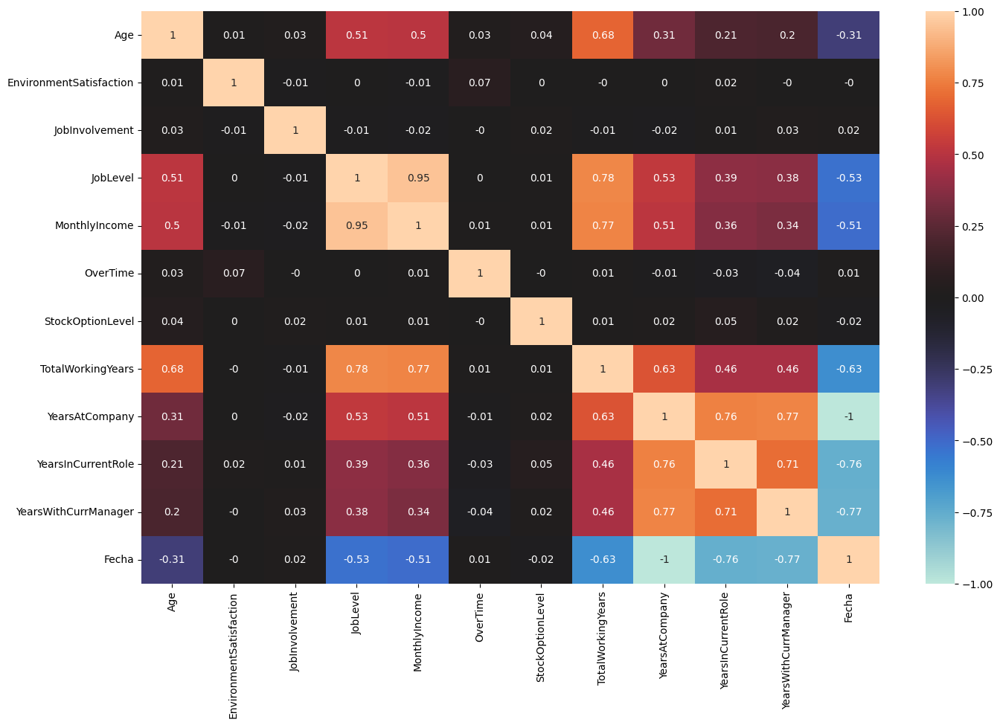

In [134]:
# Display correlation between varaibles
plt.figure(figsize=(16, 10))

correlation = df.loc[:,df.columns.isin(['OverTime', 'TotalWorkingYears', 'JobLevel', 'YearsInCurrentRole', 'MonthlyIncome',
                     'Age', 'YearsWithCurrManager', 'StockOptionLevel', 'YearsAtCompany', 'Fecha',
                     'JobInvolvement', 'EnvironmentSatisfaction'])].corr().round(2)
sns.heatmap(correlation, vmin=-1, vmax=1, center=0 , annot=True)
plt.yticks(rotation=0)
plt.show()

In [ ]:

fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(16, 25))

for i, col in enumerate(['OverTime', 'TotalWorkingYears', 'JobLevel', 'YearsInCurrentRole', 'MonthlyIncome',
                     'Age', 'YearsWithCurrManager', 'StockOptionLevel', 'YearsAtCompany', 'Fecha',
                     'JobInvolvement', 'EnvironmentSatisfaction']):
    subplt = ax[i // 2, i % 2]
    sns.countplot(data=df, x=col, hue='Attrition', ax=subplt, order=df[col].value_counts().index)
    subplt.set_title(f'Attrition: {col}')
    subplt.legend(title='Resigned', labels=['No', 'Yes'])
    subplt.set_ylabel('Employee Count')
    if col == 'JobRole':
        subplt.set_xticklabels(subplt.get_xticklabels(), rotation=45, ha='right', wrap=True)

plt.subplots_adjust(hspace=.5)
plt.tight_layout()
plt.show()





<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. El número de empleados masculinos en la organización representa una proporción mayor que la de empleadas femeninas en más del 20%.<br>
2. Los empleados masculinos se van más de la organización en comparación con las empleadas femeninas.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de la Attrition por edad. </div> 

In [ ]:
#Visualization to show Employee Distribution by Age.
plt.figure(figsize=(13.5,6))
plt.subplot(1,2,1)
sns.histplot(x="Age",hue="Attrition",data=df,kde=True,palette=["blue","orange"])
plt.title("Employee Distribution by Age",fontweight="black",size=20,pad=10)


#Visualization to show Employee Distribution by Age & Attrition.
plt.subplot(1,2,2)
sns.boxplot(x="Attrition",y="Age",data=df,palette=["orange","blue"])
plt.title("Employee Distribution by Age & Attrition",fontweight="black",size=20,pad=10)
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. La mayoría de los empleados tienen entre 30 y 40 años.<br>
2. Podemos observar claramente una tendencia de que a medida que aumenta la edad, la deserción disminuye.<br>
3. Del diagrama de caja también podemos observar que la edad media del empleado que dejó la organización es menor que la de los empleados que están trabajando en la organización.<br>
4. Los empleados jóvenes abandonan más la empresa en comparación con los empleados mayores.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition por Environment Satisfaction. </div> 


In [ ]:
#Visualization to show Total Employees by EnvironmentSatisfaction.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["EnvironmentSatisfaction"].value_counts()
plt.title("Employees by EnvironmentSatisfaction", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by EnvironmentSatisfaction.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["EnvironmentSatisfaction"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,order=value_2.index,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by Environment Satisfaction",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(attrition_rate[index])+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La mayoría de los empleados han calificado la satisfacción del entorno de la organización como Alta y Muy alta.<br>
2. Aunque la satisfacción del entorno de la organización es alta, todavía hay una gran deserción en este entorno.<br>
3. La tasa de deserción aumenta con el aumento del nivel de satisfacción ambiental.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition po Job Level. </div> 

In [ ]:
#Visualization to show Total Employees by Job Level.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["JobLevel"].value_counts()
plt.title("Employees by Job Level", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.8,startangle=90,
        colors=['#FF6D8C', '#FF8C94', '#FFAC9B', '#FFCBA4',"#FFD8B1"],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by JobLevel.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["JobLevel"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,order=value_2.index,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by Job Level",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(attrition_rate[index])+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. La mayoría de los empleados de la organización están en el nivel de entrada o en el nivel junior.<br>
2. La deserción más alta está en el nivel de entrada.<br>
3. A medida que aumenta el nivel, la tasa de deserción disminuye.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition por Job Satisfaction. </div> 

In [ ]:
#Visualization to show Total Employees by Job Satisfaction.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["JobSatisfaction"].value_counts()
plt.title("Employees by Job Satisfaction", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.8,startangle=90,
        colors=['#FFB300', '#FFC300', '#FFD700', '#FFFF00'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by Job Satisfaction.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["JobSatisfaction"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,order=value_2.index,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by Job Satisfaction",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(attrition_rate[index])+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La mayoría de los empleados han calificado su satisfacción laboral como alta o muy alta.<br>
2. La mayoría de los empleados que calificaron su satisfacción laboral como baja abandonan la organización.<br>
3. Todas las categorías de satisfacción laboral tienen una alta tasa de deserción.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition por Monthly Income. </div> 

In [ ]:
#Visualization to show Employee Distribution by MonthlyIncome.
plt.figure(figsize=(13,6))
plt.subplot(1,2,1)
sns.histplot(x="MonthlyIncome", hue="Attrition", kde=True ,data=df,palette=["#11264e","#6faea4"])
plt.title("Employee Attrition by Monthly Income",fontweight="black",size=20,pad=15)

#Visualization to show Employee Attrition by Monthly Income.
plt.subplot(1,2,2)
sns.boxplot(x="Attrition",y="MonthlyIncome",data=df,palette=["#D4A1E7","#6faea4"])
plt.title("Employee Attrition by Monthly Income",fontweight="black",size=20,pad=15)
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. A la mayoría de los empleados se les paga menos de 10000 en la organización.<br>
2. El ingreso mensual promedio de los empleados que se fueron es comparativamente bajo con los empleados que todavía están trabajando.<br>
3. A medida que aumenta el ingreso mensual, disminuye la deserción.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition por Over Time. </div> 


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La mayoría de los empleados no trabajan para OverTime.<br>
2. La característica OverTime tiene un desequilibrio de clase muy alto debido a que no podemos obtener información significativa.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analyzing de Attrition por Total Working Years. </div> 

In [ ]:
# Define the bin edges for the groups
bin_edges = [0, 5, 10, 20, 50]

# Define the labels for the groups
bin_labels = ['0-5 years', '5-10 years', '10-20 years', "20+ years"]

# Cut the DailyRate column into groups
df["TotalWorkingYearsGroup"] = pd.cut(df['TotalWorkingYears'], bins=bin_edges, labels=bin_labels)

In [ ]:
#Visualization to show Total Employees by TotalWorkingYearsGroup.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["TotalWorkingYearsGroup"].value_counts()
plt.title("Employees by TotalWorkingYears", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181', '#E7A1A1'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by TotalWorkingYearsGroup.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["TotalWorkingYearsGroup"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index.tolist(), y=value_2.values,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by TotalWorkingYears",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(attrition_rate[index]))+"%)",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. La mayoría de los empleados tienen un total de 5 a 10 años de experiencia laboral. Pero su Tasa de Deserción también es muy alta.<br>
2. Los empleados con experiencia laboral de menos de 10 años tienen una alta tasa de deserción.<br>
3. Los empleados con experiencia laboral de más de 10 años tienen una tasa de deserción menor.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analyzing de Attrition por Years at Company. </div> 

In [ ]:
# Define the bin edges for the groups
bin_edges = [0, 1, 5, 10, 20]

# Define the labels for the groups
bin_labels = ['0-1 years', '2-5 years', '5-10 years', "10+ years"]

# Cut the DailyRate column into groups
df["YearsAtCompanyGroup"] = pd.cut(df['YearsAtCompany'], bins=bin_edges, labels=bin_labels)

In [ ]:
#Visualization to show Total Employees by YearsAtCompanyGroup.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["YearsAtCompanyGroup"].value_counts()
plt.title("Employees by YearsAtCompany", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#FFB300', '#FFC300', '#FFD700', '#FFFF00'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by YearsAtCompanyGroup.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["YearsAtCompanyGroup"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index.tolist(), y=value_2.values,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by YearsAtCompany",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(attrition_rate[index]))+"%)",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. La mayoría de los empleados ha trabajado de 2 a 10 años en la organización.<br>
2. Muy pocos empleados han trabajado menos de 1 año o más de 10 años.<br>
3. Los empleados que han trabajado durante 2 a 5 años tienen una tasa de deserción muy alta.<br>
4. Los empleados que han trabajado durante más de 10 años tienen una baja tasa de deserción.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analyzing de Attrition por Years In Current Role. </div> 

In [ ]:
# Define the bin edges for the groups
bin_edges = [0, 1, 5, 10, 20]

# Define the labels for the groups
bin_labels = ['0-1 years', '2-5 years', '5-10 years', "10+ years"]

# Cut the DailyRate column into groups
df["YearsInCurrentRoleGroup"] = pd.cut(df['YearsInCurrentRole'], bins=bin_edges, labels=bin_labels)

In [ ]:
#Visualization to show Total Employees by YearsInCurrentRoleGroup.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["YearsInCurrentRoleGroup"].value_counts()
plt.title("Employees by YearsInCurrentRole", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#6495ED', '#87CEEB', '#00BFFF', '#1E90FF'],textprops={"fontweight":"black","size":15,"color":"black"})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by YearsInCurrentRoleGroup.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["YearsInCurrentRoleGroup"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index.tolist(), y=value_2.values,palette= ["orange","green","yellow","blue","brown"])
plt.title("Attrition Rate by YearsInCurrentRole",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(attrition_rate[index]))+"%)",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>

1. La mayoría de los empleados ha trabajado durante 2 a 10 años en el mismo puesto en la organización.<br>
2. Muy pocos empleados han trabajado menos de 1 año o más de 10 años en el mismo puesto.<br>
3. Los empleados que han trabajado de 2 a 0 años en el mismo rol tienen una tasa de deserción muy alta.<br>
4. Los empleados que han trabajado durante más de 10 años en el mismo rol tienen una baja tasa de deserción.<br></div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Analisis de Attrition por Years with Current Manager. </div> 

In [ ]:
# Define the bin edges for the groups
bin_edges = [0, 1, 5, 10, 20]

# Define the labels for the groups
bin_labels = ['0-1 years', '2-5 years', '5-10 years', "10+ years"]

# Cut the DailyRate column into groups
df["YearsWithCurrManagerGroup"] = pd.cut(df['YearsWithCurrManager'], bins=bin_edges, labels=bin_labels)

In [ ]:
#Visualization to show Total Employees by YearsWithCurrManagerGroup.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = df["YearsWithCurrManagerGroup"].value_counts()
plt.title("Employees by YearsWithCurrManager", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors= ['#FF8000', '#FF9933', '#FFB366', '#FFCC99'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

    
#Visualization to show Attrition Rate by YearsWithCurrManagerGroup.
plt.subplot(1,2,2)
new_df = df[df["Attrition"]=="Yes"]
value_2 = new_df["YearsWithCurrManagerGroup"].value_counts()
attrition_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index.tolist(), y=value_2.values,palette=["#11264e","#6faea4","#FEE08B","#D4A1E7","#E7A1A1"])
plt.title("Attrition Rate by YearsWithCurrManager",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(attrition_rate[index]))+"%)",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
1. Casi el 51 % de los empleados ha trabajado durante 2 a 5 años con el mismo gerente.<br>
2. Casi el 38% de los empleados ha trabajado durante 5 a 10 años con el mismo gerente.<br>
3. Los empleados que han trabajado durante más de 10 años con el mismo gerente tienen una tasa de deserción muy baja.<br>
4. Otras categorías tienen una alta tasa de deserción.<br></div>

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:orange;overflow:hidden"><b> Análisis estadístico: importancia de las características. </b></div>


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="lefAt"><font color=blue>💬 Conclusion:</font></h3>
- La prueba Anova se utiliza para analizar el impacto de diferentes características numéricas en una característica categórica de respuesta.<br>
- La prueba Anova devuelve dos valores estadísticos f_score y p_value.<br>
- Nota:<br>
    1. Una puntuación F mayor indica una asociación más fuerte entre la(s) variable(s) independiente(s) y la variable dependiente.<br>
    2. Si el valor p está por debajo del nivel de significancia elegido (p. ej., p menor que 0,05), entonces podemos rechazar nuestra hipótesis nula.<br></div>

Esta función utiliza la biblioteca matplotlib y seaborn en Python para crear un gráfico de barras que compara los valores de puntuación F obtenidos en un test de análisis de varianza (ANOVA).

Aquí tienes un desglose de lo que hace cada línea de código:

plt.figure(figsize=(15,6)): Esta línea crea una nueva figura con un tamaño de 15 pulgadas de ancho y 6 pulgadas de alto. Proporciona un lienzo en el que se dibujará el gráfico de barras.

keys = list(f_scores.keys()): Se crea una lista de las claves (o etiquetas) de un diccionario llamado f_scores. Estas claves representarían las categorías o variables que se están comparando en el ANOVA.

values = list(f_scores.values()): Se crea una lista de los valores correspondientes a las claves del diccionario f_scores. Estos valores representarían los puntajes F obtenidos en el ANOVA para cada categoría o variable.

sns.barplot(x=keys, y=values): Se utiliza la función barplot de la biblioteca seaborn para crear el gráfico de barras. Los valores en el eje x son las claves y en el eje y están los valores de puntuación F.

plt.title("Anova-Test F_scores Comparison", fontweight="black", size=20, pad=15): Se establece el título del gráfico con el texto "Anova-Test F_scores Comparison". También se especifican algunos atributos del título, como el grosor de la fuente (fontweight), el tamaño (size) y el espaciado entre el título y el gráfico (pad).

plt.xticks(rotation=90): Se rota el texto de las etiquetas del eje x en 90 grados para que sean legibles si son demasiado largas.

El siguiente bucle for se encarga de añadir el valor de cada barra en el gráfico. Para cada barra, se muestra el valor en la parte superior de la misma.

plt.show(): Esta línea muestra el gráfico de barras completo.

En resumen, esta función toma los valores de puntuación F obtenidos en un ANOVA, los visualiza en un gráfico de barras utilizando seaborn y matplotlib, y añade etiquetas y título para una mejor comprensión de los datos.

In [ ]:
import numpy as np
df = pd.read_csv(r'C:\Users\Admin\Desktop\IBM\Data\WA_Fn-UseC_-HR-Employee-Attrition.csv')
num_cols = df.select_dtypes(np.number).columns

In [ ]:
new_df = df.copy()

new_df["Attrition"] = new_df["Attrition"].replace({"No":0,"Yes":1})

In [ ]:
import pandas as pd
from scipy import stats

f_scores = {}
p_values = {}

for column in num_cols:
    f_score, p_value = stats.f_oneway(new_df[column], new_df["Attrition"])
    
    f_scores[column] = f_score
    p_values[column] = p_value


In [ ]:
f_scores = {}
p_values = {}

for column in num_cols:
    f_score, p_value = stats.f_oneway(new_df[column],new_df["Attrition"])
    
    f_scores[column] = f_score
    p_values[column] = p_value

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;">Visualizing the F_Score of ANOVA Test of Each Numerical features. </div> 